# Credit Card Fraud Detection:

This project aims to develop and evaluate machine learning models, including XGBoost, Random Forest, and Artificial Neural Networks, to accurately classify credit card transactions as fraudulent or legitimate. The goal is to minimize financial losses for banks by effectively identifying and preventing fraudulent activities

In [2]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.utils import class_weight
from imblearn.over_sampling import SMOTE # For handling class imbalance
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [3]:
data = pd.read_csv('C:/Users/siyal/Downloads/creditcard.csv') #Load

In [4]:
print(data.head()) # Show data

   Time        V1        V2        V3        V4        V5        V6        V7  \
0   0.0 -1.359807 -0.072781  2.536347  1.378155 -0.338321  0.462388  0.239599   
1   0.0  1.191857  0.266151  0.166480  0.448154  0.060018 -0.082361 -0.078803   
2   1.0 -1.358354 -1.340163  1.773209  0.379780 -0.503198  1.800499  0.791461   
3   1.0 -0.966272 -0.185226  1.792993 -0.863291 -0.010309  1.247203  0.237609   
4   2.0 -1.158233  0.877737  1.548718  0.403034 -0.407193  0.095921  0.592941   

         V8        V9  ...       V21       V22       V23       V24       V25  \
0  0.098698  0.363787  ... -0.018307  0.277838 -0.110474  0.066928  0.128539   
1  0.085102 -0.255425  ... -0.225775 -0.638672  0.101288 -0.339846  0.167170   
2  0.247676 -1.514654  ...  0.247998  0.771679  0.909412 -0.689281 -0.327642   
3  0.377436 -1.387024  ... -0.108300  0.005274 -0.190321 -1.175575  0.647376   
4 -0.270533  0.817739  ... -0.009431  0.798278 -0.137458  0.141267 -0.206010   

        V26       V27       V28 

In [5]:
# Data Summary
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

The DataFrame contains 284,807 rows and 31 columns, All columns are numerical, with 30 float64 columns and 1 int64 column (likely the target variable), and There are no missing values in any of the columns.

In [6]:
print(data.describe()) # key characteristics of data

                Time            V1            V2            V3            V4  \
count  284807.000000  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05   
mean    94813.859575  1.168375e-15  3.416908e-16 -1.379537e-15  2.074095e-15   
std     47488.145955  1.958696e+00  1.651309e+00  1.516255e+00  1.415869e+00   
min         0.000000 -5.640751e+01 -7.271573e+01 -4.832559e+01 -5.683171e+00   
25%     54201.500000 -9.203734e-01 -5.985499e-01 -8.903648e-01 -8.486401e-01   
50%     84692.000000  1.810880e-02  6.548556e-02  1.798463e-01 -1.984653e-02   
75%    139320.500000  1.315642e+00  8.037239e-01  1.027196e+00  7.433413e-01   
max    172792.000000  2.454930e+00  2.205773e+01  9.382558e+00  1.687534e+01   

                 V5            V6            V7            V8            V9  \
count  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05   
mean   9.604066e-16  1.487313e-15 -5.556467e-16  1.213481e-16 -2.406331e-15   
std    1.380247e+00  1.332271e+00  1.23709

In [7]:
print(data.isnull().sum()) # Looking for NaN 

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64


In [8]:
duplicate_count = data.duplicated().sum()
print("Number of duplicate rows:", duplicate_count)

Number of duplicate rows: 1081


In [9]:
data_clean = data.drop_duplicates()  # remove duplicates and assign the result
print(data_clean.head())          # then print the first few rows

   Time        V1        V2        V3        V4        V5        V6        V7  \
0   0.0 -1.359807 -0.072781  2.536347  1.378155 -0.338321  0.462388  0.239599   
1   0.0  1.191857  0.266151  0.166480  0.448154  0.060018 -0.082361 -0.078803   
2   1.0 -1.358354 -1.340163  1.773209  0.379780 -0.503198  1.800499  0.791461   
3   1.0 -0.966272 -0.185226  1.792993 -0.863291 -0.010309  1.247203  0.237609   
4   2.0 -1.158233  0.877737  1.548718  0.403034 -0.407193  0.095921  0.592941   

         V8        V9  ...       V21       V22       V23       V24       V25  \
0  0.098698  0.363787  ... -0.018307  0.277838 -0.110474  0.066928  0.128539   
1  0.085102 -0.255425  ... -0.225775 -0.638672  0.101288 -0.339846  0.167170   
2  0.247676 -1.514654  ...  0.247998  0.771679  0.909412 -0.689281 -0.327642   
3  0.377436 -1.387024  ... -0.108300  0.005274 -0.190321 -1.175575  0.647376   
4 -0.270533  0.817739  ... -0.009431  0.798278 -0.137458  0.141267 -0.206010   

        V26       V27       V28 

In [10]:
duplicate_count = data_clean.duplicated().sum()
print("Number of duplicate rows:", duplicate_count) # after duplication results

Number of duplicate rows: 0


# Let's do some EDA and Visualization :

Univariate Analysis (Individual Features)

Distributions of Numeric Variables:

Use histograms or density plots to check distributions for each column.

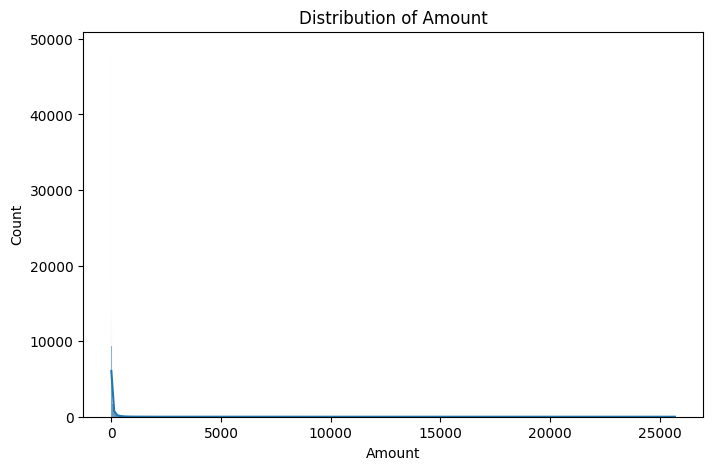

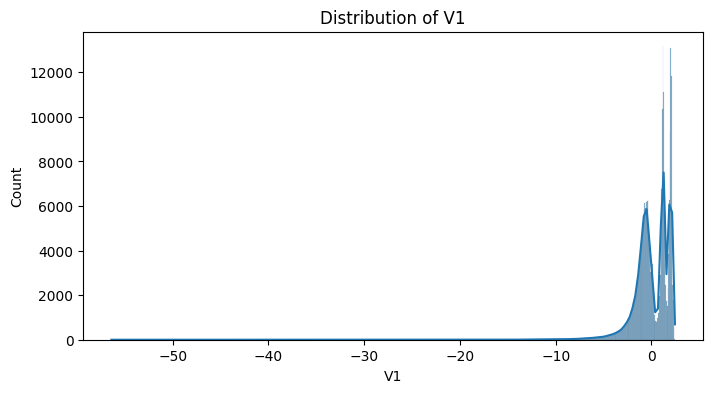

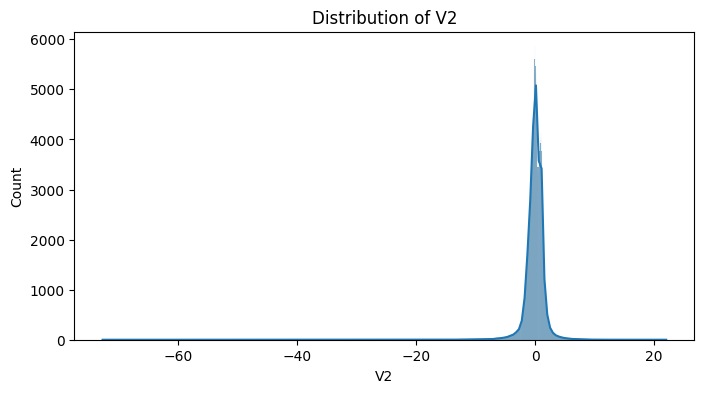

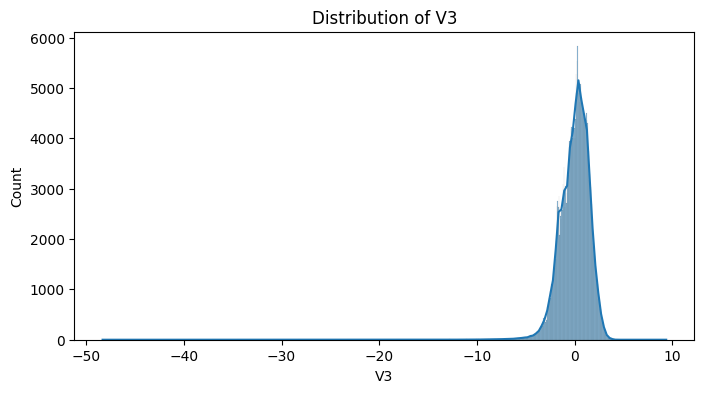

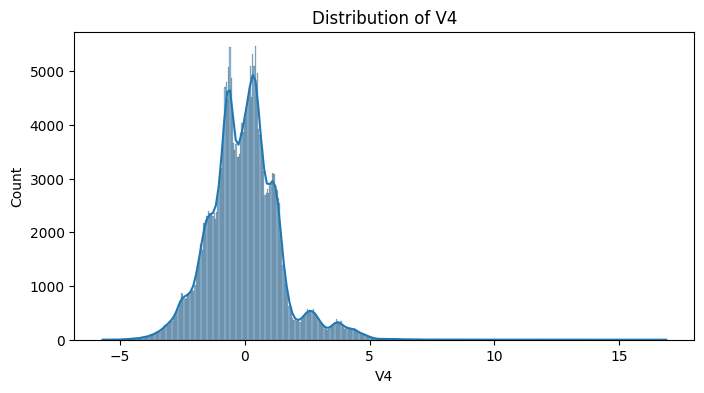

...

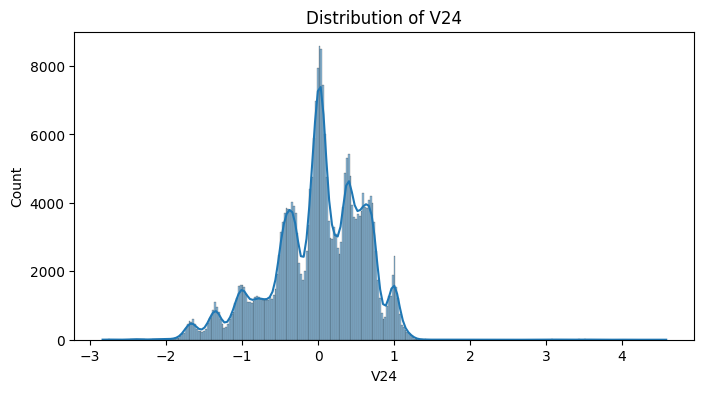

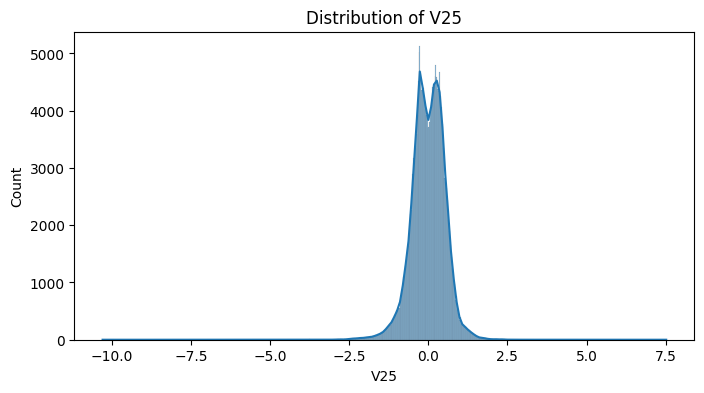

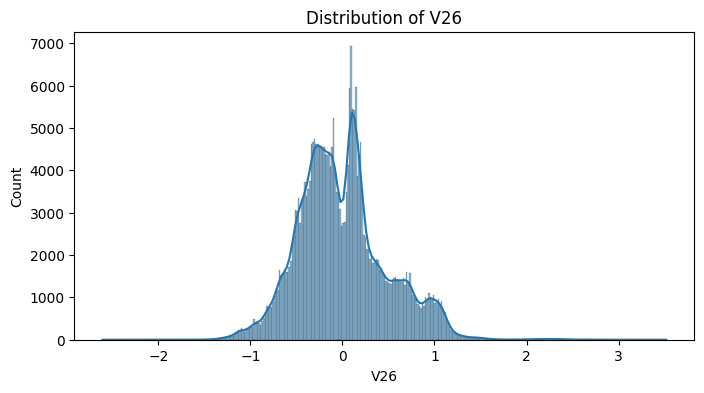

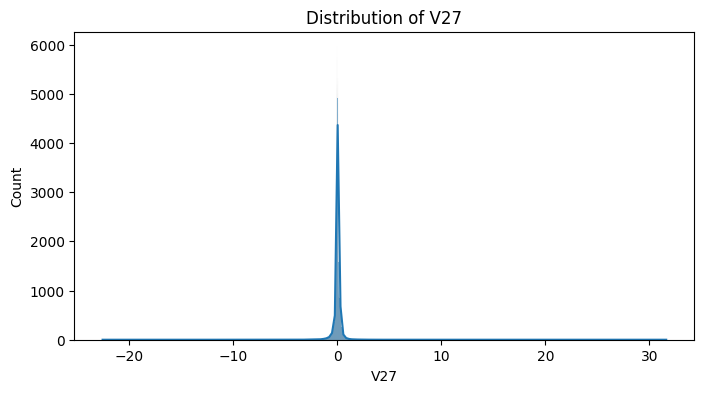

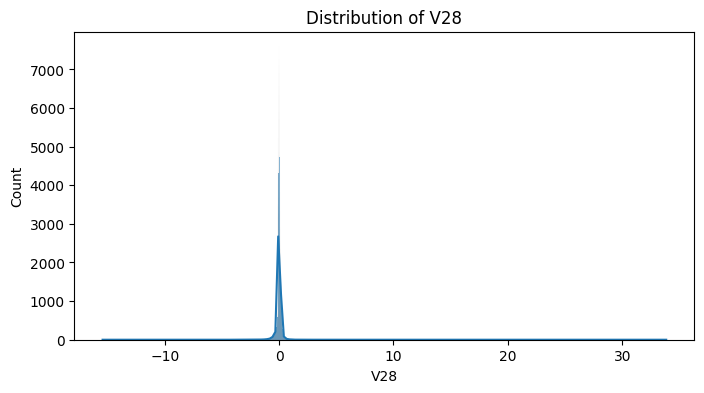

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogram for the 'Amount' column
plt.figure(figsize=(8, 5))
sns.histplot(data_clean['Amount'], kde=True)
plt.title("Distribution of Amount")
plt.show()

# Loop through V1 to V28 (assuming these are PCA components or transformed features)
for i in range(1, 29):
    col = f'V{i}'
    plt.figure(figsize=(8, 4))
    sns.histplot(data_clean[col], kde=True)
    plt.title(f"Distribution of {col}")
    plt.show()

Analyze the Time Column:

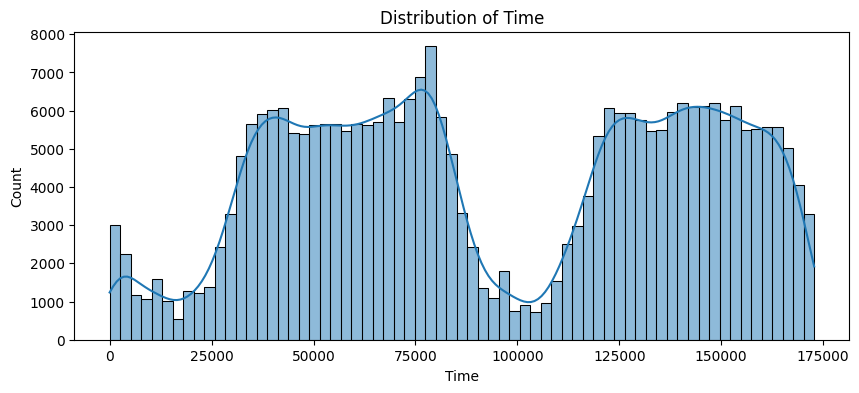

In [11]:
plt.figure(figsize=(10, 4))
sns.histplot(data_clean['Time'], kde=True)
plt.title("Distribution of Time")
plt.show()

Looking at this graph, This appears to be a timestamp. Here's why:

The x-axis values start at 0 and go up to around 175,000
The pattern shows two distinct peaks with a valley between them
This kind of pattern is typical of timestamps showing recurring events (like daily activities) rather than elapsed time.

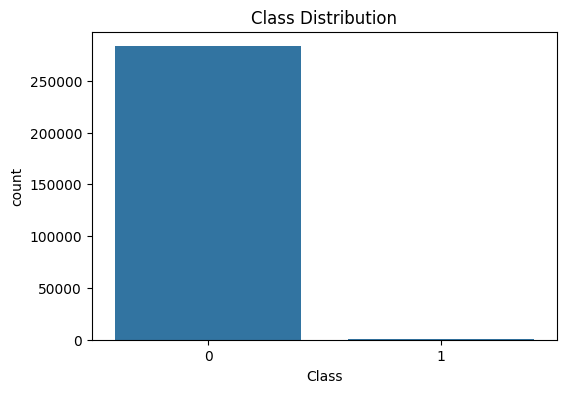

In [12]:
plt.figure(figsize=(6, 4))
sns.countplot(x='Class', data=data_clean)
plt.title("Class Distribution")
plt.show()

this shows a clear class imbalance. Class 0 has around 275,000 samples while Class 1 appears to have very few or almost no samples, making this a highly imbalanced binary classification dataset.

Bivariate Analysis (Relationships Between Features):

Correlation Matrix:

Let's Identify relationships among features using a heatmap.

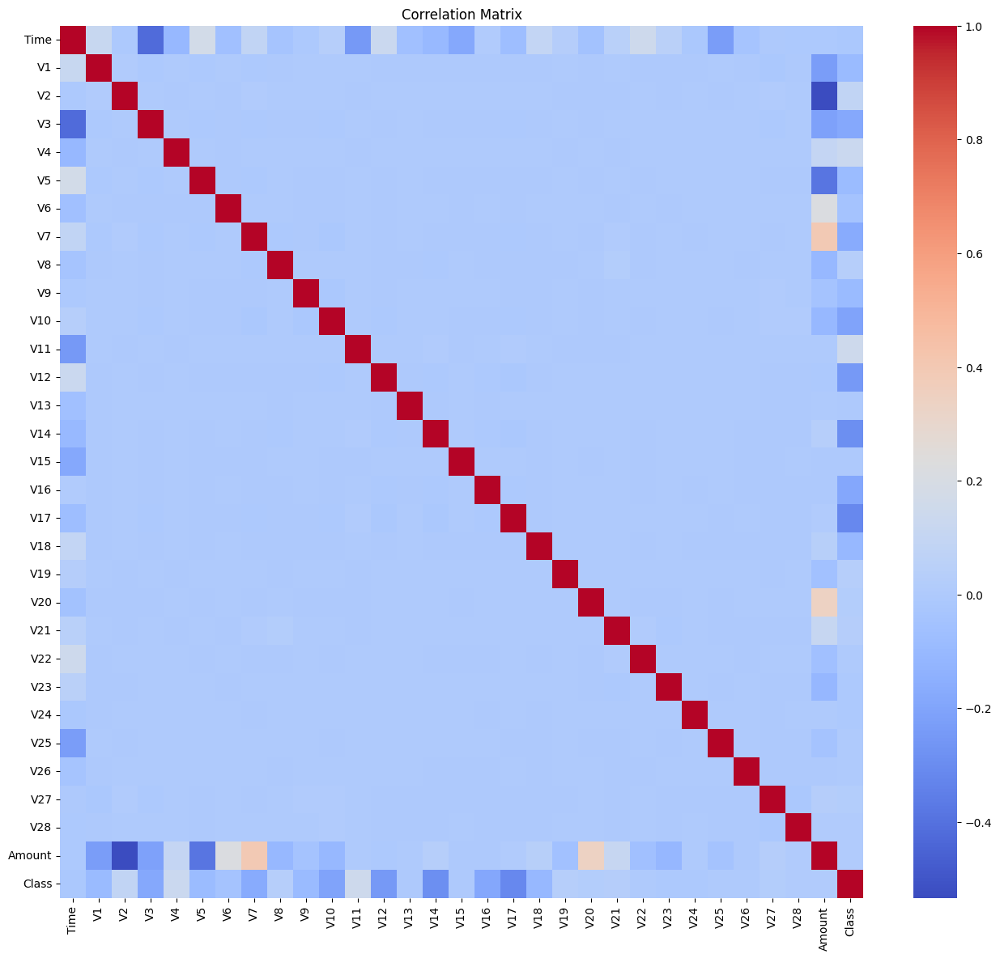

In [13]:
plt.figure(figsize=(16, 14))
correlation_matrix = data_clean.corr()
sns.heatmap(correlation_matrix, cmap="coolwarm", annot=False)
plt.title("Correlation Matrix")
plt.show()

Most features show very weak or almost no correlation with each other, meaning they are largely independent variables. This suggests each feature might be contributing unique information to the dataset.

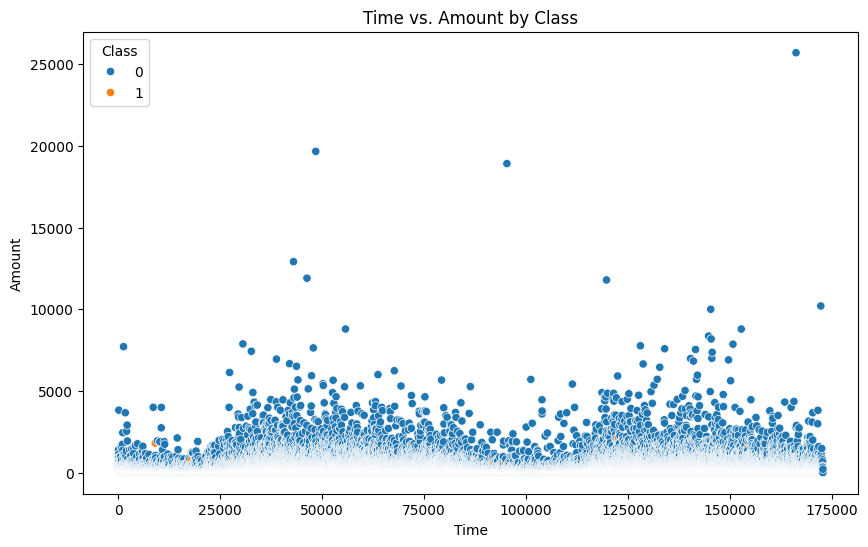

In [14]:
# Scatter plot for Time vs. Amount
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Time', y='Amount', hue='Class', data=data_clean)
plt.title("Time vs. Amount by Class")
plt.show()

Class 1 (orange) represents rare fraudulent transactions, while Class 0 (blue) shows normal, frequent transactions.

Multivariate Analysis:

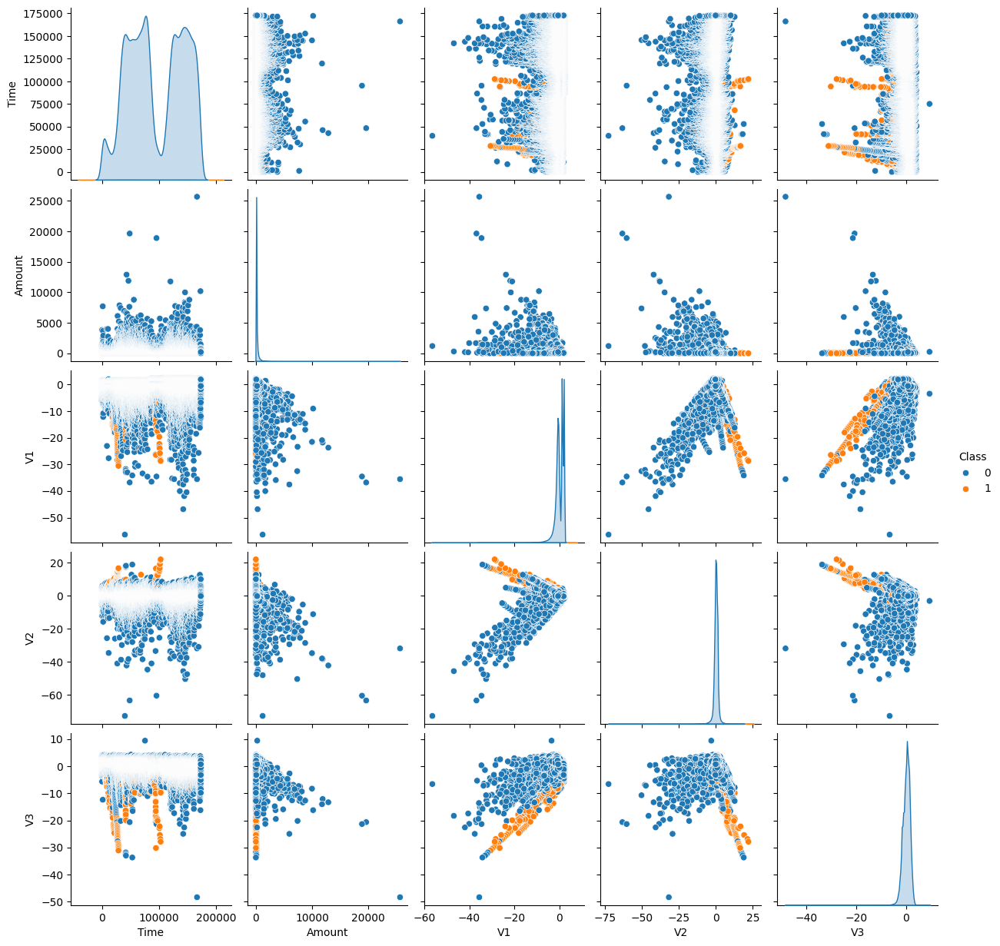

In [15]:
cols = ['Time', 'Amount', 'V1', 'V2', 'V3', 'Class']
sns.pairplot(data_clean[cols], hue='Class')
plt.show()

Scatter plot matrix showing relationships between Time, Amount, V1, V2, and V3 variables, colored by class (blue for normal, orange for fraud). Key observations:

Diagonal shows distribution of each variable
Time has a cyclic pattern (suggesting daily patterns)
Amount is mostly low with some high spikes
V1, V2, V3 (transformed features) show some separation between normal (blue) and fraud (orange) transactions
Some plots (especially with V1-V3) show clearer clustering of fraudulent transactions, suggesting these features might be good predictors

The visualizations confirm both the class imbalance and reveal some potential patterns that could help identify fraudulent transactions, particularly in the transformed variables (V1-V3).

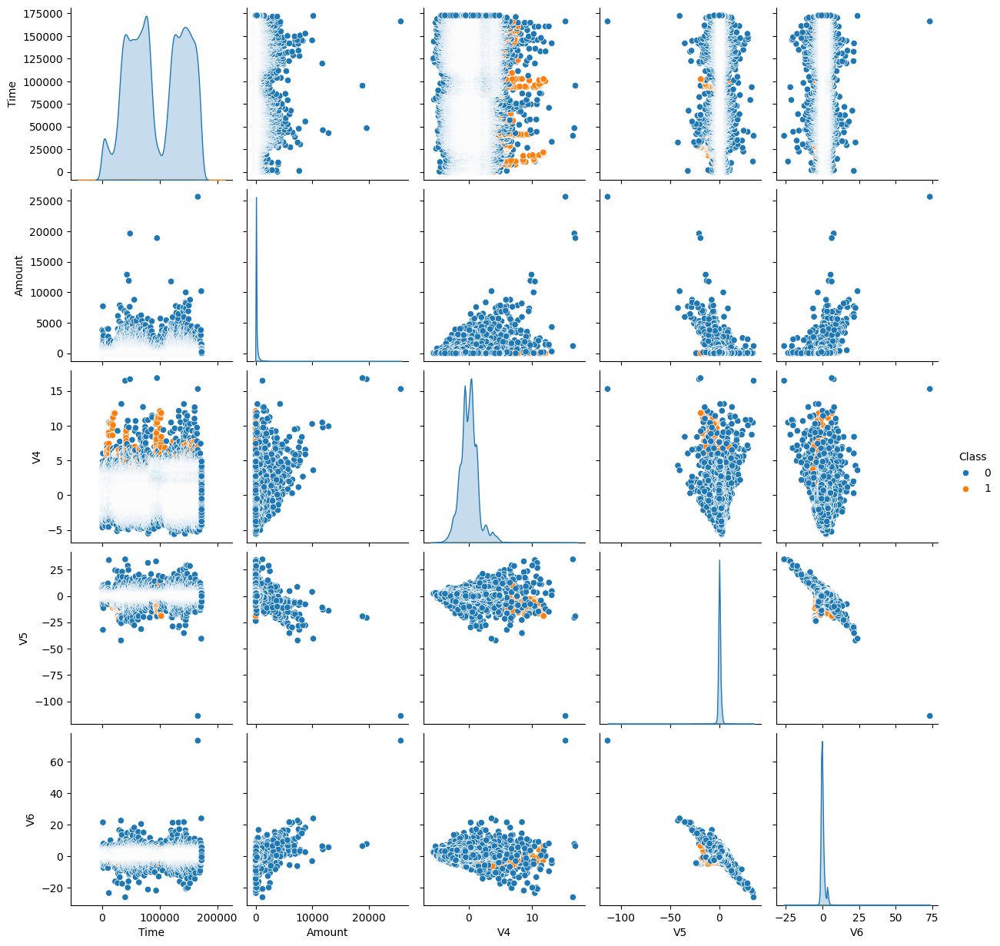

In [16]:
cols = ['Time', 'Amount','V4', 'V5', 'V6', 'Class']
sns.pairplot(data_clean[cols], hue='Class')
plt.show()

Amount is mostly low with some high spikes V4, V5, V6 (transformed features) show some separation between normal (blue) and fraud (orange) transactions Some plots (especially with V4-V6) show clearer clustering of fraudulent transactions, suggesting these features might be good predictors

The visualizations confirm both the class imbalance and reveal some potential patterns that could help identify fraudulent transactions, particularly in the transformed variables (V4-V6).

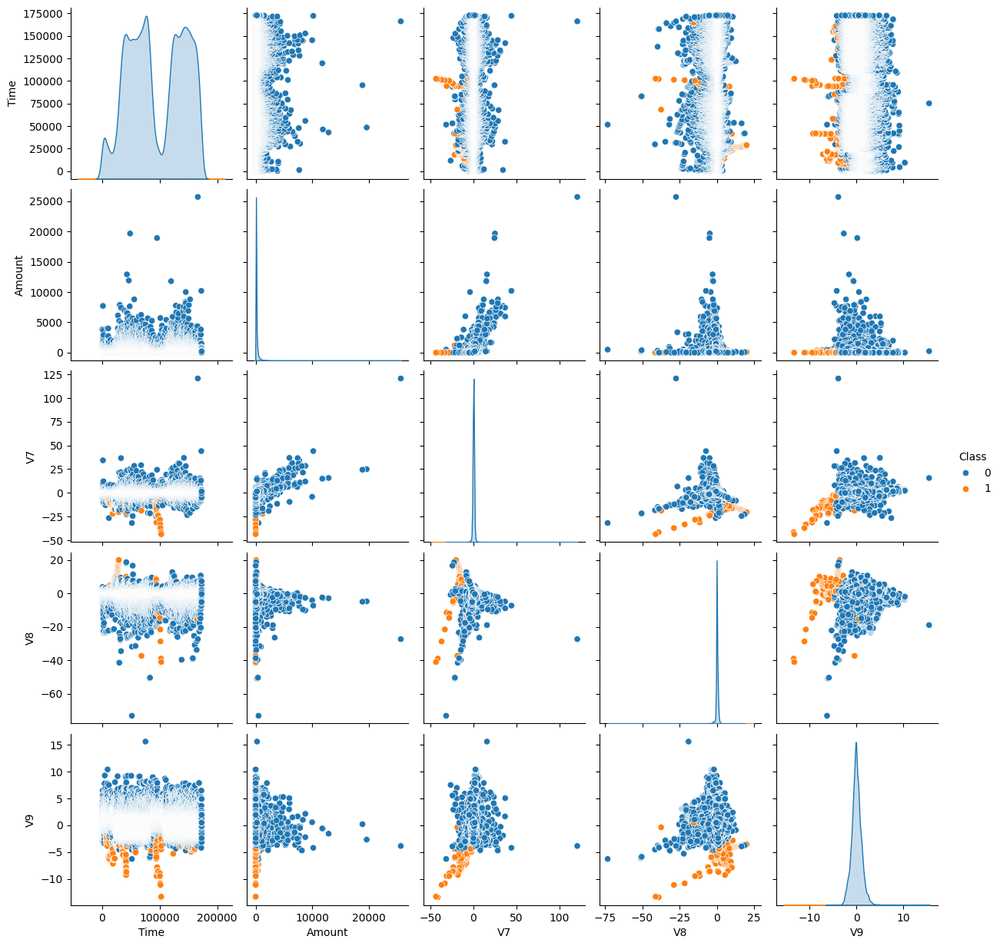

In [17]:
cols = ['Time', 'Amount','V7', 'V8', 'V9', 'Class']
sns.pairplot(data_clean[cols], hue='Class')
plt.show()

Amount is mostly low with some high spikes V7, V8, V9 (transformed features) show some separation between normal (blue) and fraud (orange) transactions Some plots (especially with V7-V9) show clearer clustering of fraudulent transactions, suggesting these features might be good predictors

The visualizations confirm both the class imbalance and reveal some potential patterns that could help identify fraudulent transactions, particularly in the transformed variables (V7-V9).

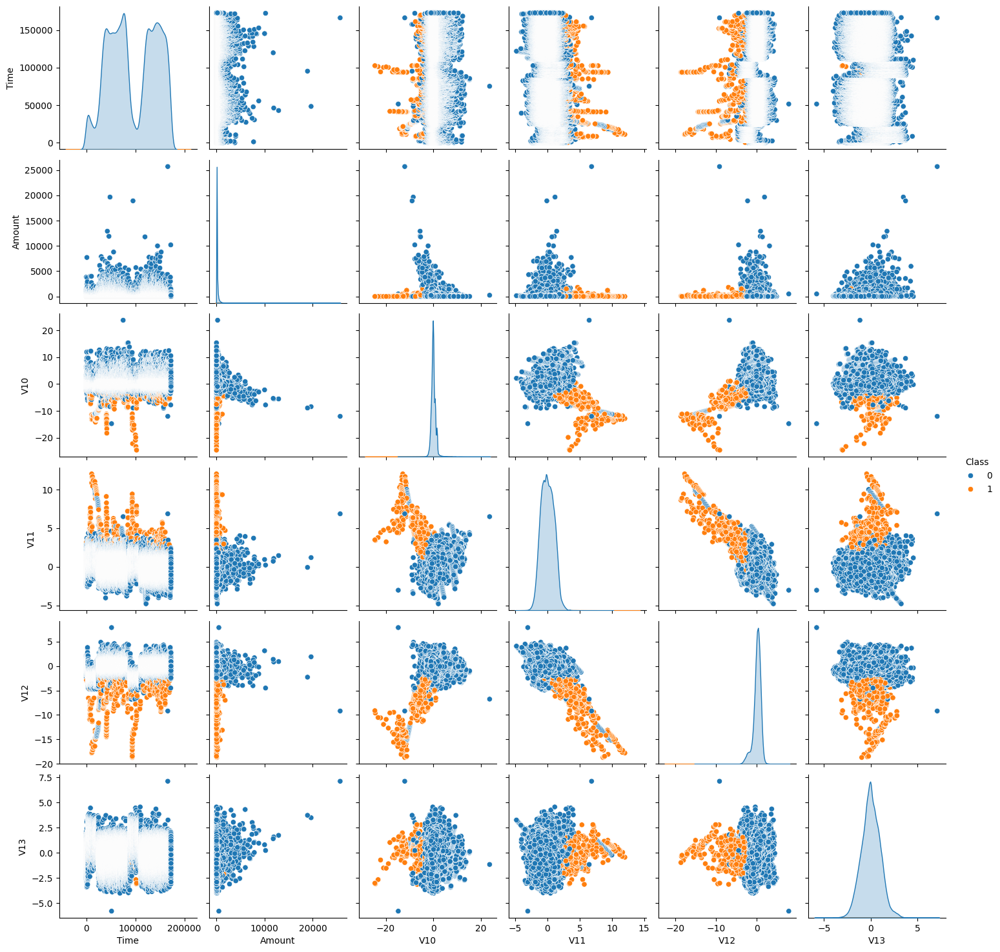

In [18]:
cols = ['Time', 'Amount','V10', 'V11', 'V12', 'V13', 'Class']
sns.pairplot(data_clean[cols], hue='Class')
plt.show()

Amount is mostly low with some high spikes V10-V13 (transformed features) show some separation between normal (blue) and fraud (orange) transactions Some plots (especially with V10-V13) show clearer clustering of fraudulent transactions, suggesting these features might be good predictors

The visualizations confirm both the class imbalance and reveal some potential patterns that could help identify fraudulent transactions, particularly in the transformed variables (V10-V13).

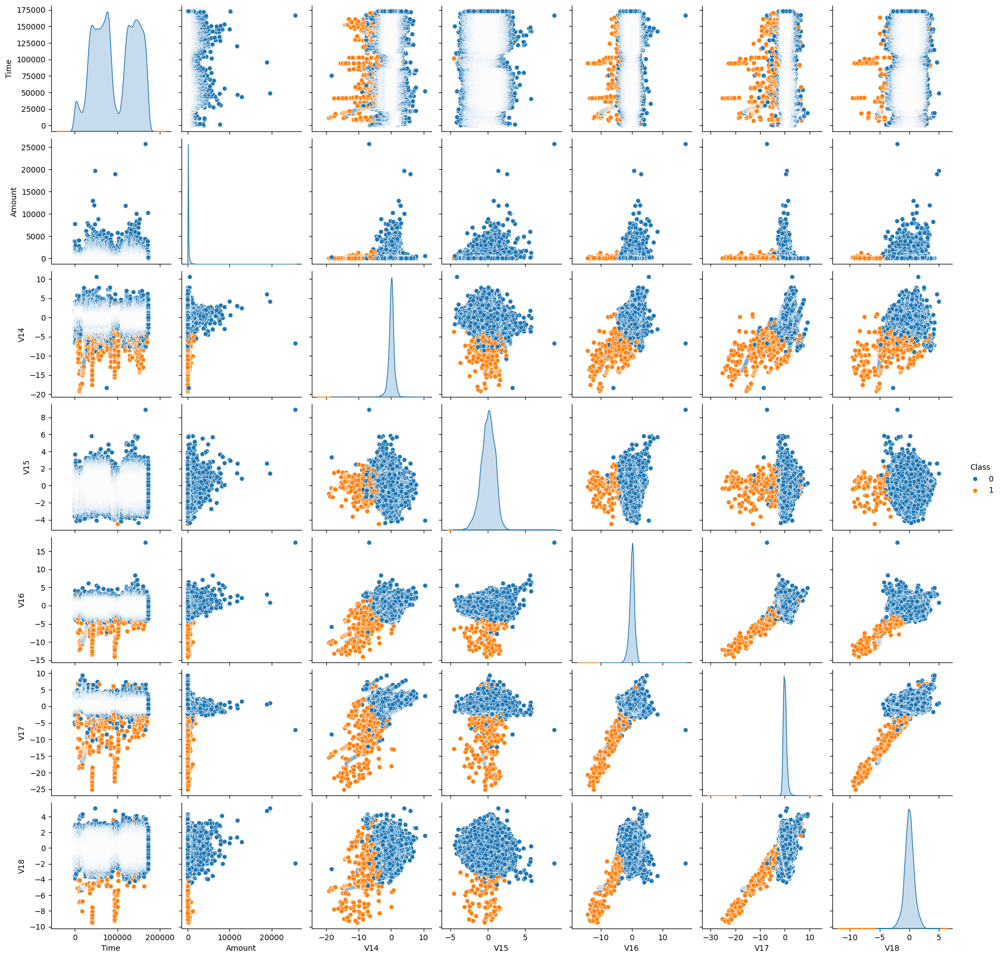

In [19]:
cols = ['Time', 'Amount','V14', 'V15', 'V16', 'V17','V18', 'Class']
sns.pairplot(data_clean[cols], hue='Class')
plt.show()

Amount is mostly low with some high spikes V14-V18 (transformed features) show some separation between normal (blue) and fraud (orange) transactions Some plots (especially with V14-V18) show clearer clustering of fraudulent transactions, suggesting these features might be good predictors

The visualizations confirm both the class imbalance and reveal some potential patterns that could help identify fraudulent transactions, particularly in the transformed variables (V14-V18).

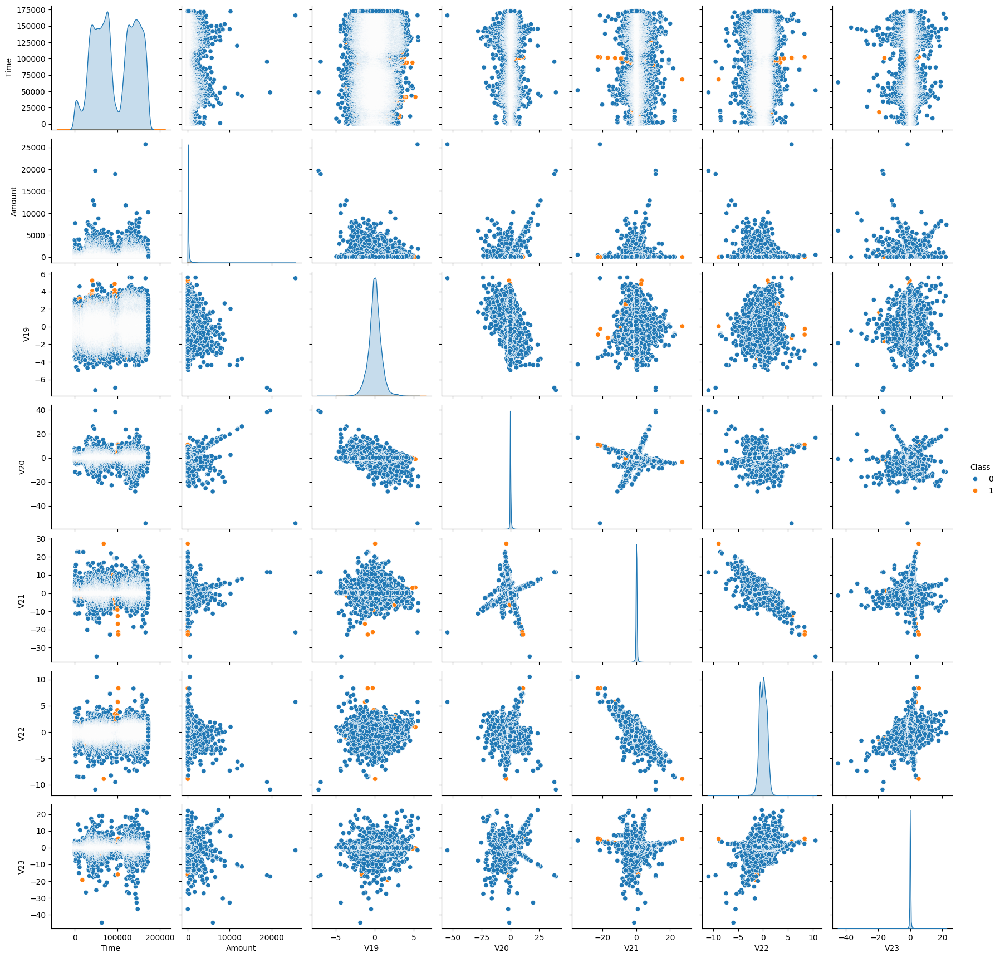

In [20]:
cols = ['Time', 'Amount','V19', 'V20', 'V21', 'V22','V23', 'Class']
sns.pairplot(data_clean[cols], hue='Class')
plt.show()

Amount is mostly low with some high spikes V19-V23 (transformed features) show some separation between normal (blue) and fraud (orange) transactions Some plots (especially with V19-V23) show clearer clustering of fraudulent transactions, suggesting these features might be good predictors

The visualizations confirm both the class imbalance and reveal some potential patterns that could help identify fraudulent transactions, particularly in the transformed variables (V19-V23).

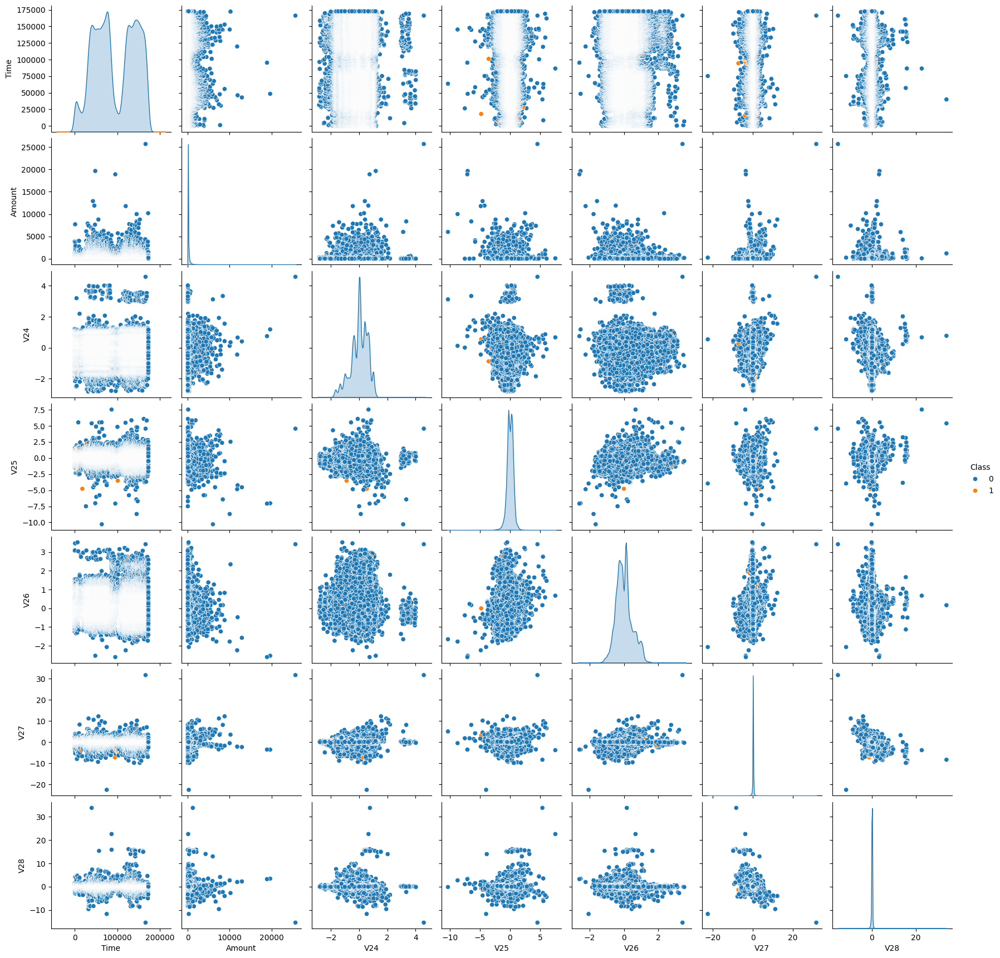

In [21]:
cols = ['Time', 'Amount','V24', 'V25', 'V26', 'V27','V28', 'Class']
sns.pairplot(data_clean[cols], hue='Class')
plt.show()

This pair plot (scatter plot matrix) visualizing relationships between selected features (Time, Amount, V24–V28) of the dataset, with color-coded classes (0 for non-fraud and 1 for fraud). The diagonal plots show individual feature distributions, while off-diagonal scatter plots depict feature interactions. Fraudulent transactions (orange points) appear as isolated or sparse clusters, indicating potential anomalies.

Address Class Imbalance:
Resampling:

In [22]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Define features (X) and target (y)
X = data_clean.drop('Class', axis=1)  # Features (Time, Amount, V1-V28)
y = data_clean['Class']               # Target (0 = non-fraud, 1 = fraud)

# Check shapes
print("Original X shape:", X.shape)  # Should be (rows, 30 features)
print("Original y shape:", y.shape)  # Should be (rows,)

Original X shape: (283726, 30)
Original y shape: (283726,)


Apply SMOTE:

In [30]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X, y)

print("Resampled X shape:", X_res.shape)  # Should be (2 * minority_class_count, 30)
print("Resampled y shape:", y_res.shape)

Resampled X shape: (566506, 30)
Resampled y shape: (566506,)


Class Weighting:

In [31]:
model = XGBClassifier(scale_pos_weight=100)  # Penalize fraud misclassifications 100x more

Feature Engineering
Time-Based Features:

In [32]:
data_clean['Hour'] = data_clean['Time'] % 24  # Convert seconds to hours

C:\Users\siyal\AppData\Local\Temp\ipykernel_3700\478647446.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_clean['Hour'] = data_clean['Time'] % 24  # Convert seconds to hours


Transaction Amount:

In [33]:
data_clean['Log_Amount'] = np.log1p(data_clean['Amount'])

C:\Users\siyal\AppData\Local\Temp\ipykernel_3700\2305001072.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_clean['Log_Amount'] = np.log1p(data_clean['Amount'])


Anomaly Detection Isolation Forest:

In [34]:
from sklearn.ensemble import IsolationForest
iso = IsolationForest(contamination=0.01)  # Assume 1% fraud
iso.fit(X)
fraud_pred = iso.predict(X)  # -1 = outlier (fraud), 1 = inlier

Feature Selection: Recursive Feature Elimination (RFE):

In [36]:
from sklearn.feature_selection import RFE
selector = RFE(XGBClassifier(), n_features_to_select=15)
selector.fit(X_res, y_res)
X_selected = selector.transform(X_res)

XGBoost (Best for Imbalanced Data):

In [37]:
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix

X = data_clean.drop('Class', axis=1)        # Features (Time, Amount, V1-V28)
y = data_clean['Class']                     # Target (0 = non-fraud, 1 = fraud)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    stratify=y,       # Preserve class imbalance in splits
    random_state=42
)

# Handle class imbalance
scale_pos_weight = len(y_train[y_train == 0]) / len(y_train[y_train == 1])

# Train XGBoost
model_xgb = XGBClassifier(
    scale_pos_weight=scale_pos_weight,
    n_estimators=100,
    random_state=42
)
model_xgb.fit(X_train, y_train)

# Evaluate
y_pred = model_xgb.predict(X_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56651
           1       0.94      0.77      0.84        95

    accuracy                           1.00     56746
   macro avg       0.97      0.88      0.92     56746
weighted avg       1.00      1.00      1.00     56746

[[56646     5]
 [   22    73]]


The model performs exceptionally well on class 0 (high precision, recall, and F1-score), but performance on class 1 is slightly lower. This is likely due to class imbalance. The model has very high accuracy overall, but this might be misleading due to the class imbalance.

Model 2: Isolation Forest (Anomaly Detection):

In [38]:
from sklearn.ensemble import IsolationForest

# Assume fraud rate is ~0.1% (contamination = 0.001)
model_iso = IsolationForest(
    contamination=0.001,
    random_state=42
)

# Fit on training data (no labels needed for anomaly detection)
model_iso.fit(X_train)

# Convert predictions to binary labels (-1 = fraud, 1 = normal)
y_pred_iso = model_iso.predict(X_test)
y_pred_iso = [1 if x == -1 else 0 for x in y_pred_iso]  # Map to 0/1

In [39]:
print(classification_report(y_test, y_pred_iso))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_iso))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56651
           1       0.26      0.16      0.20        95

    accuracy                           1.00     56746
   macro avg       0.63      0.58      0.60     56746
weighted avg       1.00      1.00      1.00     56746

Confusion Matrix:
 [[56608    43]
 [   80    15]]


The model performs very well in identifying non-fraudulent transactions (high precision and recall for class 0) but struggles to accurately detect fraudulent transactions (low precision and recall for class 1). This is likely due to the class imbalance in the dataset.

Confusion Matrix Comparison
Visualize True Positives (TP), False Positives (FP), and False Negatives (FN) for both models.

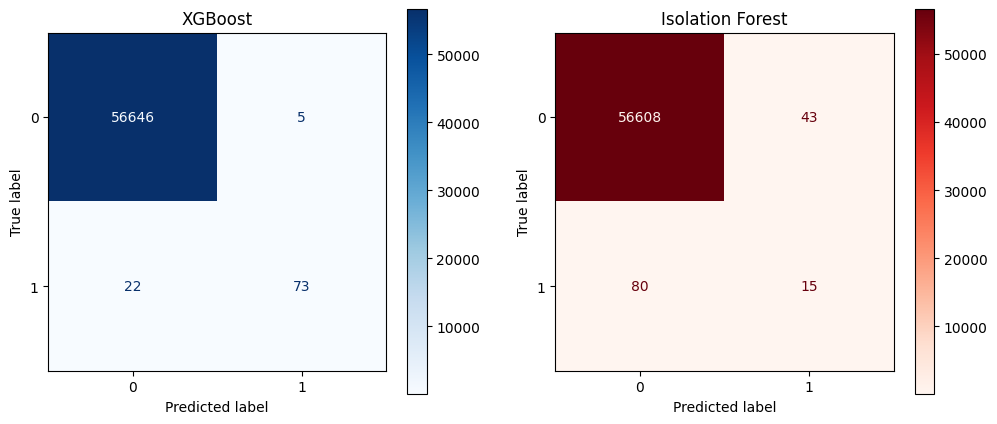

In [40]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# XGBoost predictions
y_pred_xgb = model_xgb.predict(X_test)

# Isolation Forest predictions (convert to 0/1)
y_pred_iso = model_iso.predict(X_test)
y_pred_iso = [1 if x == -1 else 0 for x in y_pred_iso]

# Plot confusion matrices
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# XGBoost
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_xgb, ax=ax[0], cmap='Blues')
ax[0].set_title("XGBoost")

# Isolation Forest
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_iso, ax=ax[1], cmap='Reds')
ax[1].set_title("Isolation Forest")

plt.show()

2. Precision-Recall Curve (XGBoost) vs. Anomaly Score Distribution (Isolation Forest)
XGBoost (Precision-Recall Curve):

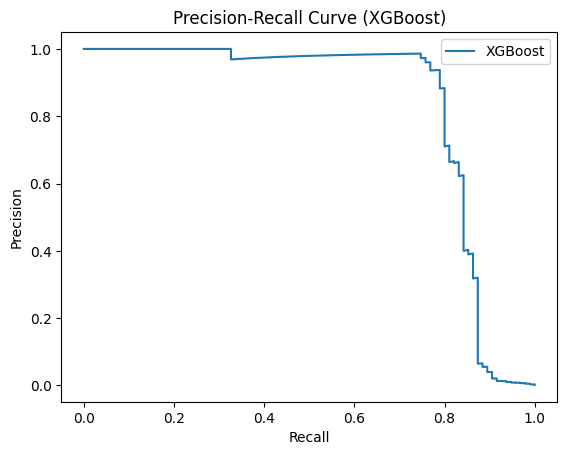

In [41]:
from sklearn.metrics import precision_recall_curve

# Get predicted probabilities for fraud class
y_proba_xgb = model_xgb.predict_proba(X_test)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_test, y_proba_xgb)

plt.plot(recall, precision, label='XGBoost')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (XGBoost)')
plt.legend()
plt.show()

Isolation Forest (Anomaly Score Distribution):

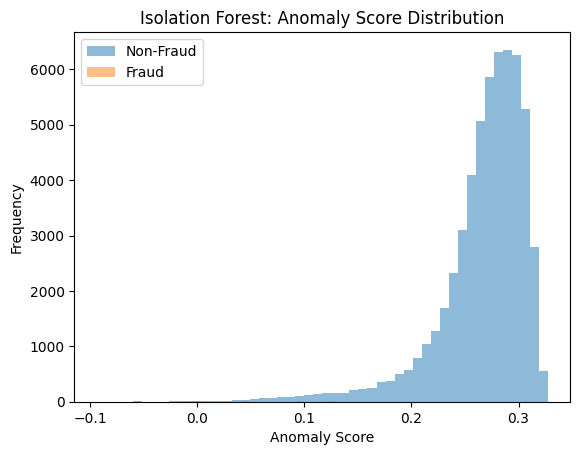

In [42]:
# Get anomaly scores (-1 to 1)
anomaly_scores = model_iso.decision_function(X_test)

plt.hist(anomaly_scores[y_test == 0], bins=50, alpha=0.5, label='Non-Fraud')
plt.hist(anomaly_scores[y_test == 1], bins=50, alpha=0.5, label='Fraud')
plt.xlabel('Anomaly Score')
plt.ylabel('Frequency')
plt.title('Isolation Forest: Anomaly Score Distribution')
plt.legend()
plt.show()

XGBoost: A curve closer to the top-right corner indicates better performance.

Isolation Forest: Fraud cases (orange) should have lower anomaly scores (more negative).

In [43]:
X_test = X_test.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

3. t-SNE Projection with Predictions:

AttributeError: 'numpy.ndarray' object has no attribute 'loc'

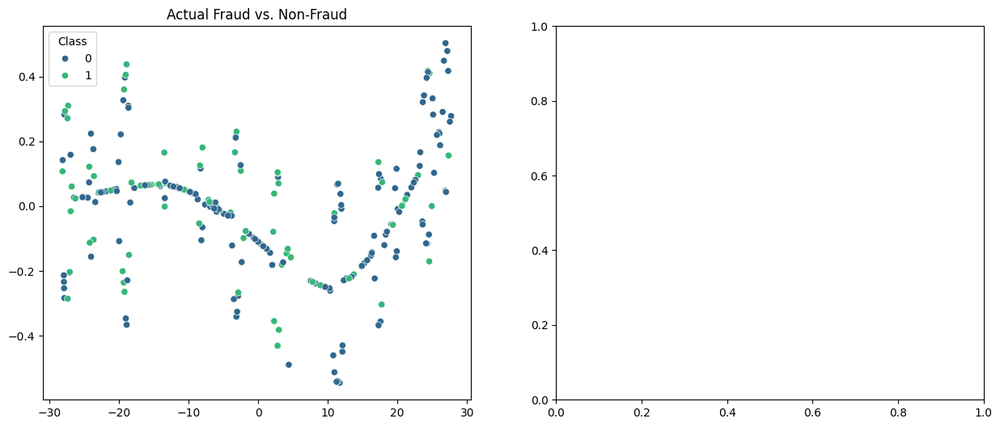

In [45]:
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Subsample data for faster t-SNE (fraud is rare)
fraud_indices = y_test[y_test == 1].index
non_fraud_indices = y_test[y_test == 0].sample(n=2*len(fraud_indices), random_state=42).index
combined_indices = fraud_indices.union(non_fraud_indices)

X_sub = X_test.loc[combined_indices]
y_sub = y_test.loc[combined_indices]

# Compute t-SNE
X_tsne = TSNE(n_components=2, random_state=42).fit_transform(X_sub)

# Plot actual vs. predicted labels
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# Actual Labels
sns.scatterplot(x=X_tsne[:,0], y=X_tsne[:,1], hue=y_sub, ax=ax[0], palette='viridis')
ax[0].set_title('Actual Fraud vs. Non-Fraud')

# XGBoost Predictions (assuming y_pred_xgb is a Series aligned with y_test)
sns.scatterplot(x=X_tsne[:,0], y=X_tsne[:,1], hue=y_pred_xgb.loc[combined_indices], ax=ax[1], palette='viridis')
ax[1].set_title('XGBoost Predictions')

plt.show()

4. Feature Importance (XGBoost) vs. Anomaly Contribution (Isolation Forest):

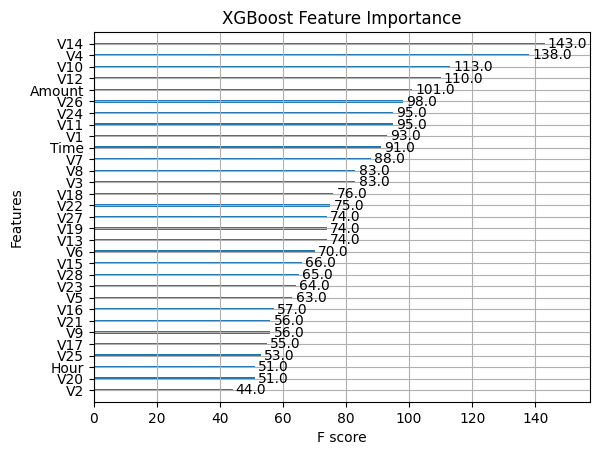

In [46]:
from xgboost import plot_importance
plot_importance(model_xgb)
plt.title('XGBoost Feature Importance')
plt.show()

Isolation Forest (Anomaly Contribution):

In [58]:
pip install lime


     ---------------------------------------- 0.0/275.7 kB ? eta -:--:--
     - -------------------------------------- 10.2/275.7 kB ? eta -:--:--
     -- ---------------------------------- 20.5/275.7 kB 217.9 kB/s eta 0:00:02
     ---- -------------------------------- 30.7/275.7 kB 220.2 kB/s eta 0:00:02
     -------- ---------------------------- 61.4/275.7 kB 297.7 kB/s eta 0:00:01
     ---------- -------------------------- 81.9/275.7 kB 353.1 kB/s eta 0:00:01
     ------------- ---------------------- 102.4/275.7 kB 347.8 kB/s eta 0:00:01
     ------------- ---------------------- 102.4/275.7 kB 347.8 kB/s eta 0:00:01
     ------------- ---------------------- 102.4/275.7 kB 347.8 kB/s eta 0:00:01
     ------------- ---------------------- 102.4/275.7 kB 347.8 kB/s eta 0:00:01
     ---------------- ------------------- 122.9/275.7 kB 257.8 kB/s eta 0:00:01
     -------------------- --------------- 153.6/275.7 kB 286.7 kB/s eta 0:00:01
     ---------------------------- ------- 215.0/275.

Permutation Importance Based on Anomaly Scores:

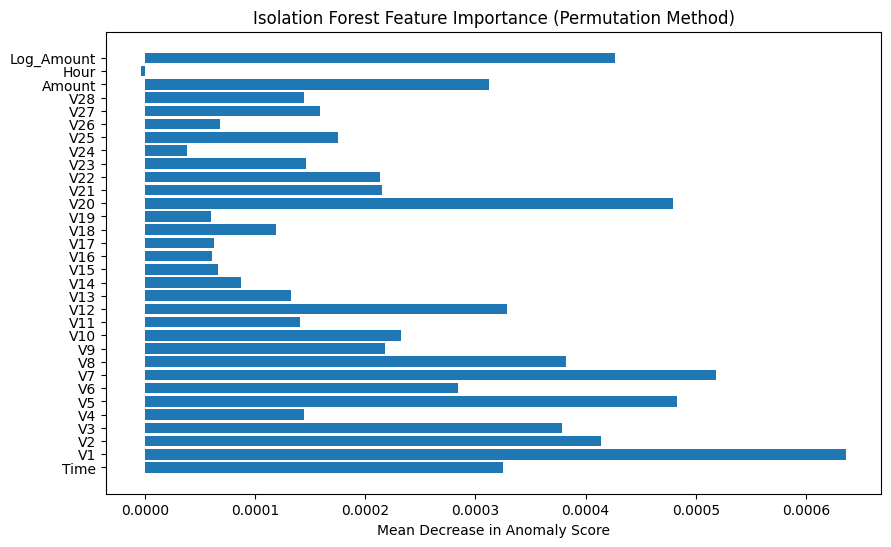

In [47]:
import numpy as np
import matplotlib.pyplot as plt

# Compute baseline anomaly scores
baseline_scores = model_iso.decision_function(X_test)

# Calculate permutation importance
perm_importance = []
for col in X_test.columns:
    X_permuted = X_test.copy()
    X_permuted[col] = np.random.permutation(X_permuted[col])  # Shuffle feature
    permuted_scores = model_iso.decision_function(X_permuted)
    importance = np.mean(baseline_scores - permuted_scores)  # Score drop = importance
    perm_importance.append(importance)

# Plot
plt.figure(figsize=(10, 6))
plt.barh(X_test.columns, perm_importance)
plt.title("Isolation Forest Feature Importance (Permutation Method)")
plt.xlabel("Mean Decrease in Anomaly Score")
plt.show()

2. Compare Outlier vs. Inlier Distributions :

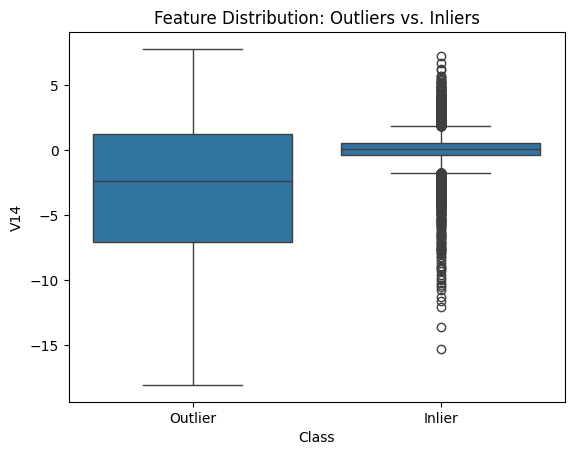

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Get predicted outliers (-1) and inliers (1)
y_pred_iso = model_iso.predict(X_test)
outliers = X_test[y_pred_iso == -1]
inliers = X_test[y_pred_iso == 1]

# Plot for a specific feature (e.g., 'V14')
sns.boxplot(
    data=pd.DataFrame({
        'V14': pd.concat([outliers['V14'], inliers['V14']]),
        'Class': ['Outlier'] * len(outliers) + ['Inlier'] * len(inliers)
    }),
    x='Class', y='V14'
)
plt.title("Feature Distribution: Outliers vs. Inliers")
plt.show()

Statistical Test (Mann-Whitney U):

In [49]:
from scipy.stats import mannwhitneyu

# Compare distributions for all features
for col in X_test.columns:
    stat, p = mannwhitneyu(outliers[col], inliers[col])
    if p < 0.05:
        print(f"{col}: p-value = {p:.4f} (significant difference)")

V1: p-value = 0.0000 (significant difference)
V3: p-value = 0.0000 (significant difference)
V4: p-value = 0.0000 (significant difference)
V5: p-value = 0.0000 (significant difference)
V6: p-value = 0.0323 (significant difference)
V8: p-value = 0.0000 (significant difference)
V9: p-value = 0.0150 (significant difference)
V10: p-value = 0.0000 (significant difference)
V11: p-value = 0.0000 (significant difference)
V12: p-value = 0.0043 (significant difference)
V13: p-value = 0.0001 (significant difference)
V14: p-value = 0.0000 (significant difference)
V15: p-value = 0.0005 (significant difference)
V16: p-value = 0.0003 (significant difference)
V17: p-value = 0.0000 (significant difference)
V18: p-value = 0.0000 (significant difference)
V19: p-value = 0.0000 (significant difference)
V21: p-value = 0.0240 (significant difference)
V24: p-value = 0.0052 (significant difference)
V25: p-value = 0.0052 (significant difference)
V28: p-value = 0.0000 (significant difference)
Amount: p-value = 0.

Let's Add model 3 which is Artificial Neural Network:

In [51]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np

# Features and target split
X = data_clean.drop('Class', axis=1)        
y = data_clean['Class']                     

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    stratify=y,       
    random_state=42
)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Calculate class weights for imbalance
class_weights = {0: 1.,
                1: len(y_train[y_train == 0])/len(y_train[y_train == 1])}

# Build neural network
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dropout(0.2),
    Dense(16, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile
model.compile(optimizer=Adam(learning_rate=0.001),
             loss='binary_crossentropy',
             metrics=['accuracy'])

# Train
history = model.fit(X_train_scaled, y_train,
                   epochs=20,
                   batch_size=32,
                   class_weight=class_weights,
                   validation_split=0.2)

# Evaluate
y_pred = (model.predict(X_test_scaled) > 0.5).astype(int)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

C:\Users\siyal\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
5675/5675 ━━━━━━━━━━━━━━━━━━━━ 31s 5ms/step - accuracy: 0.9692 - loss: 2.4014 - val_accuracy: 0.9772 - val_loss: 0.1328
Epoch 2/20
5675/5675 ━━━━━━━━━━━━━━━━━━━━ 24s 4ms/step - accuracy: 0.9760 - loss: 0.2988 - val_accuracy: 0.9847 - val_loss: 0.0772
Epoch 3/20
5675/5675 ━━━━━━━━━━━━━━━━━━━━ 26s 5ms/step - accuracy: 0.9748 - loss: 0.4250 - val_accuracy: 0.9896 - val_loss: 0.0932
Epoch 4/20
5675/5675 ━━━━━━━━━━━━━━━━━━━━ 25s 4ms/step - accuracy: 0.9770 - loss: 0.3125 - val_accuracy: 0.9778 - val_loss: 0.1164
Epoch 5/20
5675/5675 ━━━━━━━━━━━━━━━━━━━━ 25s 4ms/step - accuracy: 0.9766 - loss: 0.2521 - val_accuracy: 0.9662 - val_loss: 0.2127
Epoch 6/20
5675/5675 ━━━━━━━━━━━━━━━━━━━━ 27s 5ms/step - accuracy: 0.9766 - loss: 0.2394 - val_accuracy: 0.9771 - val_loss: 0.0771
Epoch 7/20
5675/5675 ━━━━━━━━━━━━━━━━━━━━ 25s 4ms/step - accuracy: 0.9747 - loss: 0.2635 - val_accuracy: 0.9966 - val_loss: 0.0147
Epoch 8/20
5675/5675 ━━━━━━━━━━━━━━━━━━━━ 42s 4ms/step - accuracy: 0.9901 - loss: 0

The model achieves high overall accuracy (98%) but struggles with fraud detection precision (only 9% of predicted frauds are actual frauds).
However, it has good fraud recall (87% of actual frauds are detected), but with many false positives.
The imbalance challenge is evident: model correctly identified 83 frauds but had 842 false alarms, while missing 12 actual frauds.

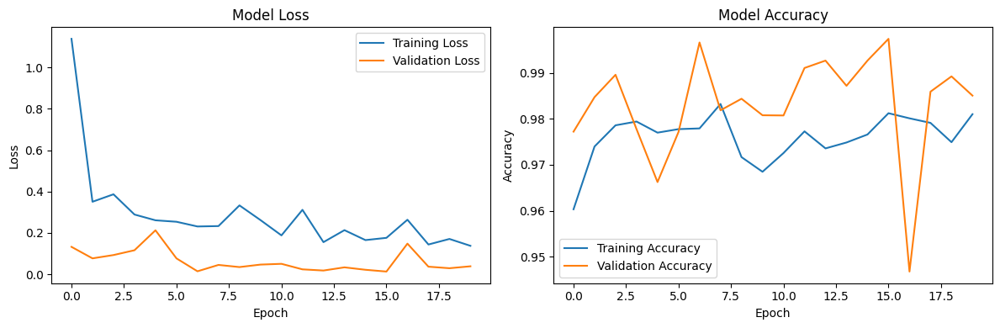

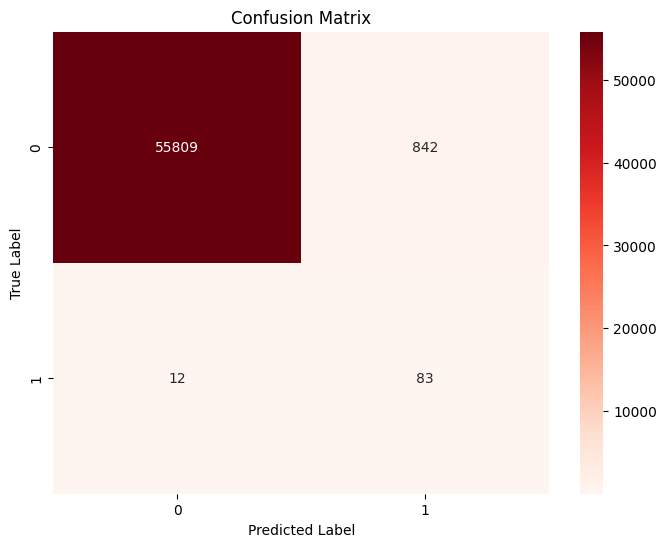

In [54]:
import matplotlib.pyplot as plt

# Plot training history
plt.figure(figsize=(12, 4))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Plot confusion matrix
import seaborn as sns

plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

This confusion matrix shows the performance of a binary classification model. It reveals that the model has a high number of True Negatives (55809) and True Positives (83), indicating good accuracy in identifying both classes. However, the high number of False Negatives (12) suggests that the model struggles to correctly identify instances of the minority class.

This graph illustrates the training and validation performance of a machine learning model over multiple epochs. The left plot shows a decreasing training loss and validation loss, suggesting successful learning. The right plot shows increasing training and validation accuracy, indicating that the model is improving its ability to correctly classify data.

Standardization (Z-score normalization):

In [56]:
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# ... (your code for loading and splitting the data) ...

# Apply SMOTE to handle class imbalance
sm = SMOTE(random_state=42) 
X_train_resampled, y_train_resampled = sm.fit_resample(X_train, y_train) 

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test) 

# ... (rest of your code) ...

In [59]:
from xgboost import XGBClassifier

xgb_model = XGBClassifier(scale_pos_weight=scale_pos_weight, random_state=42) 
xgb_model.fit(X_train_scaled, y_train_resampled)
y_pred_xgb = xgb_model.predict(X_test_scaled)
# Evaluate performance (calculate accuracy, precision, recall, F1-score, AUC)
# Train XGBoost
model_xgb = XGBClassifier(
    scale_pos_weight=scale_pos_weight,
    n_estimators=100,
    random_state=42
)
model_xgb.fit(X_train, y_train)

# Evaluate
y_pred = model_xgb.predict(X_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56651
           1       0.94      0.77      0.84        95

    accuracy                           1.00     56746
   macro avg       0.97      0.88      0.92     56746
weighted avg       1.00      1.00      1.00     56746

[[56646     5]
 [   22    73]]


In [61]:
from sklearn.ensemble import IsolationForest
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import pandas as pd

# Assuming X_train_scaled and X_test_scaled are your scaled datasets

# Create and fit the IsolationForest model
iso_forest = IsolationForest(contamination=0.01, random_state=42)
iso_forest.fit(X_train_scaled)

# Predict on the test set
y_pred_iso = iso_forest.predict(X_test_scaled)

# Convert predictions to binary labels (1 for anomaly, 0 for normal)
y_pred_iso = np.where(y_pred_iso == -1, 1, 0)

# Evaluate performance
print(classification_report(y_test, y_pred_iso))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_iso))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56651
           1       0.06      0.03      0.04        95

    accuracy                           1.00     56746
   macro avg       0.53      0.52      0.52     56746
weighted avg       1.00      1.00      1.00     56746

Confusion Matrix:
 [[56606    45]
 [   92     3]]


In [69]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import SMOTE

# Load your dataset (Replace this with your actual dataset)
data = pd.read_csv('C:/Users/siyal/Downloads/creditcard.csv') #Load

# Ensure there are no missing values
data_clean = data_clean.dropna()

# Check class distribution before proceeding
class_counts = data_clean['Class'].value_counts()
print("Class distribution before handling:", class_counts)

# Remove classes that have less than 2 instances to avoid train_test_split issues
data_clean = data_clean[data_clean['Class'].isin(class_counts[class_counts > 1].index)]

# Define Features and Target Variable
X = data_clean.drop(columns=['Class']).values  # Features
y = data_clean['Class'].values  # Target variable

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y if len(np.unique(y)) > 1 else None, random_state=42
)

# Apply SMOTE to balance the classes
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Standardize the features
scaler = StandardScaler()
X_train_resampled = scaler.fit_transform(X_train_resampled)
X_test = scaler.transform(X_test)

# Compute class weights for handling imbalance
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_resampled), y=y_train_resampled)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

# Build the Neural Network Model
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train_resampled.shape[1],)),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dropout(0.3),
    Dense(1, activation='sigmoid')  # Binary classification
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model with class weights
model.fit(X_train_resampled, y_train_resampled, 
          epochs=20, 
          batch_size=32, 
          validation_data=(X_test, y_test), 
          class_weight=class_weight_dict)

# Evaluate the model
y_pred = (model.predict(X_test) > 0.5).astype(int)

# Print classification report and confusion matrix
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Class distribution before handling: Class
0    283253
1       473
Name: count, dtype: int64


C:\Users\siyal\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
14163/14163 ━━━━━━━━━━━━━━━━━━━━ 44s 3ms/step - accuracy: 0.9736 - loss: 0.0751 - val_accuracy: 0.9978 - val_loss: 0.0126
Epoch 2/20
14163/14163 ━━━━━━━━━━━━━━━━━━━━ 53s 4ms/step - accuracy: 0.9965 - loss: 0.0129 - val_accuracy: 0.9983 - val_loss: 0.0118
Epoch 3/20
14163/14163 ━━━━━━━━━━━━━━━━━━━━ 51s 4ms/step - accuracy: 0.9972 - loss: 0.0103 - val_accuracy: 0.9980 - val_loss: 0.0142
Epoch 4/20
14163/14163 ━━━━━━━━━━━━━━━━━━━━ 52s 4ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.9981 - val_loss: 0.0154
Epoch 5/20
14163/14163 ━━━━━━━━━━━━━━━━━━━━ 62s 4ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.9986 - val_loss: 0.0152
Epoch 6/20
14163/14163 ━━━━━━━━━━━━━━━━━━━━ 74s 5ms/step - accuracy: 0.9982 - loss: 0.0073 - val_accuracy: 0.9992 - val_loss: 0.0158
Epoch 7/20
14163/14163 ━━━━━━━━━━━━━━━━━━━━ 90s 6ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.9991 - val_loss: 0.0156
Epoch 8/20
14163/14163 ━━━━━━━━━━━━━━━━━━━━ 93s 7ms/step - accuracy: 

The model is biased towards the majority class (Class 0), but SMOTE has improved minority class detection.

In [71]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import ADASYN

# Load dataset (Ensure `data_clean` is preprocessed)
X = data_clean.drop('Class', axis=1).values  # Features
y = data_clean['Class'].values  # Target

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Apply ADASYN for oversampling the minority class
adasyn = ADASYN(sampling_strategy='auto', random_state=42)
X_train_resampled, y_train_resampled = adasyn.fit_resample(X_train, y_train)

# Standardize features
scaler = StandardScaler()
X_train_resampled = scaler.fit_transform(X_train_resampled)
X_test = scaler.transform(X_test)

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_resampled), y=y_train_resampled)
class_weight_dict = {0: class_weights[0], 1: class_weights[1]}

# Build Neural Network
model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train_resampled.shape[1],)),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(1, activation='sigmoid')  # Binary classification
])

# Compile model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train model with class weights
model.fit(X_train_resampled, y_train_resampled, 
          epochs=25, 
          batch_size=32, 
          validation_data=(X_test, y_test), 
          class_weight=class_weight_dict)

# Evaluate model
y_pred = (model.predict(X_test) > 0.5).astype(int)

# Print classification report and confusion matrix
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

C:\Users\siyal\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/25
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 58s 4ms/step - accuracy: 0.9812 - loss: 0.0528 - val_accuracy: 0.9982 - val_loss: 0.0124
Epoch 2/25
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 115s 6ms/step - accuracy: 0.9975 - loss: 0.0098 - val_accuracy: 0.9987 - val_loss: 0.0140
Epoch 3/25
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.9989 - val_loss: 0.0148
Epoch 4/25
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 73s 5ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.9986 - val_loss: 0.0132
Epoch 5/25
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 58s 4ms/step - accuracy: 0.9988 - loss: 0.0048 - val_accuracy: 0.9987 - val_loss: 0.0140
Epoch 6/25
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 67s 5ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.9989 - val_loss: 0.0172
Epoch 7/25
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 74s 5ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.9991 - val_loss: 0.0173
Epoch 8/25
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 55s 4ms/step - accuracy:

 ADASYN improved minority class precision (0.81 → better than 0.79 in SMOTE) but slightly reduced recall (0.77 vs. 0.78 in SMOTE). Overall, it balances better but still struggles with recall

In [73]:
pip install keras-tuner


  Obtaining dependency information for keras-tuner from https://files.pythonhosted.org/packages/db/5d/945296512980b0827e93418514c8be9236baa6f0a1e8ca8be3a2026665b0/keras_tuner-1.4.7-py3-none-any.whl.metadata
  Obtaining dependency information for kt-legacy from https://files.pythonhosted.org/packages/16/53/aca9f36da2516db008017db85a1f3cafaee0efc5fc7a25d94c909651792f/kt_legacy-1.0.5-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/129.1 kB ? eta -:--:--
   ---------------------------------------- 0.0/129.1 kB ? eta -:--:--
   ---------------------------------------- 0.0/129.1 kB ? eta -:--:--
   ---------------------------------------- 0.0/129.1 kB ? eta -:--:--
   ---------------------------------------- 0.0/129.1 kB ? eta -:--:--
   ---------------------------------------- 0.0/129.1 kB ? eta -:--:--
   ---------------------------------------- 0.0/129.1 kB ? eta -:--:--
   ------------ --------------------------- 41.0/129.1 kB 2.0 MB/s eta 0:00:01
   ----------

In [74]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import ADASYN
import keras_tuner as kt

# Load your dataset (Replace with your actual dataset)
X = data_clean.drop('Class', axis=1).values  
y = data_clean['Class'].values  

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Apply ADASYN to balance the classes
adasyn = ADASYN(sampling_strategy='auto', random_state=42)
X_train_resampled, y_train_resampled = adasyn.fit_resample(X_train, y_train)

# Standardize the features
scaler = StandardScaler()
X_train_resampled = scaler.fit_transform(X_train_resampled)
X_test = scaler.transform(X_test)

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_resampled), y=y_train_resampled)
class_weight_dict = {0: class_weights[0], 1: class_weights[1]}

# Function to build model for hyperparameter tuning
def build_model(hp):
    model = Sequential([
        Dense(hp.Int('units1', min_value=32, max_value=128, step=32), activation='relu', input_shape=(X_train_resampled.shape[1],)),
        Dropout(hp.Float('dropout1', min_value=0.1, max_value=0.5, step=0.1)),
        Dense(hp.Int('units2', min_value=16, max_value=64, step=16), activation='relu'),
        Dropout(hp.Float('dropout2', min_value=0.1, max_value=0.5, step=0.1)),
        Dense(1, activation='sigmoid')
    ])
    
    model.compile(
        optimizer=Adam(learning_rate=hp.Choice('learning_rate', values=[0.001, 0.0005, 0.0001])),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    
    return model

# Hyperparameter tuning
tuner = kt.RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=10,  # Number of different models to try
    executions_per_trial=1,
    directory='tuner_dir',
    project_name='fraud_detection'
)

tuner.search(X_train_resampled, y_train_resampled, epochs=10, batch_size=32, validation_data=(X_test, y_test), class_weight=class_weight_dict)

# Get best model
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(f"Best hyperparameters: {best_hps.values}")

# Train final model with best hyperparameters
final_model = tuner.hypermodel.build(best_hps)
final_model.fit(X_train_resampled, y_train_resampled, epochs=20, batch_size=32, validation_data=(X_test, y_test), class_weight=class_weight_dict)

# Evaluate final model
y_pred = (final_model.predict(X_test) > 0.5).astype(int)

# Print results
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Trial 10 Complete [00h 06m 41s]
val_accuracy: 0.9992070198059082

Best val_accuracy So Far: 0.9992774724960327
Total elapsed time: 01h 10m 59s
Best hyperparameters: {'units1': 64, 'dropout1': 0.2, 'units2': 16, 'dropout2': 0.30000000000000004, 'learning_rate': 0.0005}
Epoch 1/20
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 39s 3ms/step - accuracy: 0.9661 - loss: 0.1008 - val_accuracy: 0.9964 - val_loss: 0.0156
Epoch 2/20
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 40s 3ms/step - accuracy: 0.9950 - loss: 0.0170 - val_accuracy: 0.9981 - val_loss: 0.0109
Epoch 3/20
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 35s 2ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.9987 - val_loss: 0.0112
Epoch 4/20
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 34s 2ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.9985 - val_loss: 0.0130
Epoch 5/20
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 35s 2ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.9989 - val_loss: 0.0133
Epoch 6/20
14166/14166 ━━━━━━━━━━━━━━━━━━━━ 37s 3ms/step - accurac

The model is slightly better at detecting fraud cases but at the cost of a few more false positives. If recall is the priority

Loss & Accuracy Curves (Training vs. Validation):

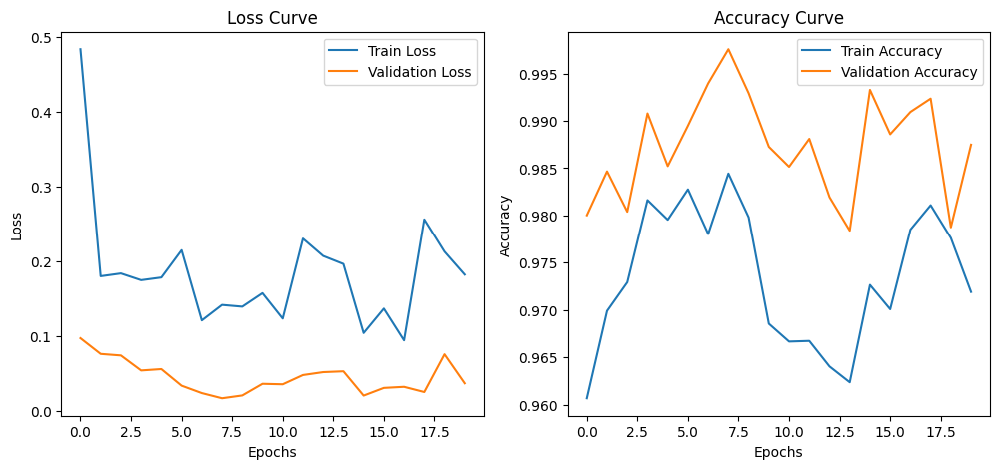

In [75]:
import matplotlib.pyplot as plt

# Assuming `history` is the output of model.fit()
plt.figure(figsize=(12, 5))

# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Curve')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Curve')
plt.legend()

plt.show()

2. Confusion Matrix Visualization:

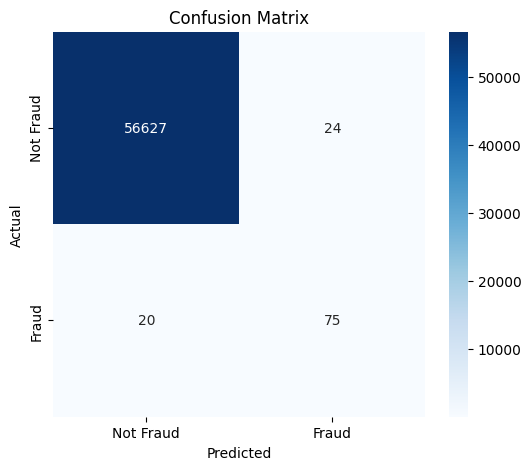

In [76]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot using seaborn
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Fraud", "Fraud"], yticklabels=["Not Fraud", "Fraud"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

3. ROC Curve & AUC Score:

1774/1774 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


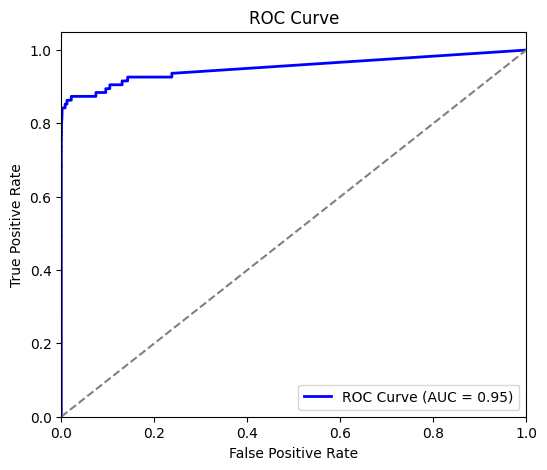

In [77]:
from sklearn.metrics import roc_curve, auc

# Get probability scores instead of hard predictions
y_pred_proba = model.predict(X_test)

# Compute ROC curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random guessing line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

4. Precision-Recall Curve:

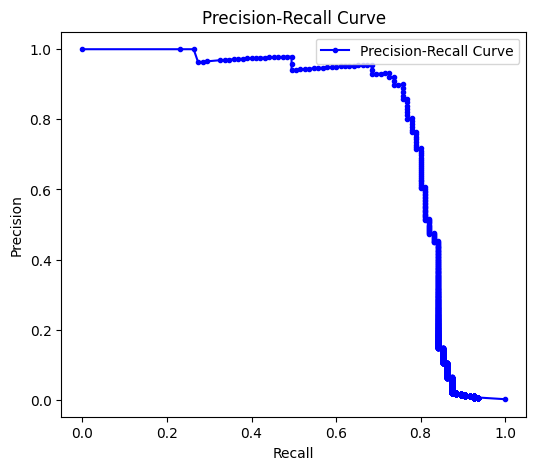

In [78]:
from sklearn.metrics import precision_recall_curve

precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)

plt.figure(figsize=(6, 5))
plt.plot(recall, precision, marker='.', color='blue', label='Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.show()

Visualize All Three Models:

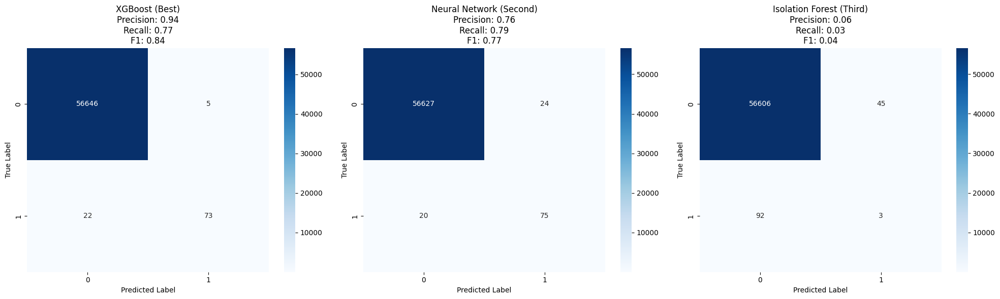

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Create a figure with 3 subplots for confusion matrices
plt.figure(figsize=(20, 6))

# Models data
models = {
   'XGBoost (Best)': {
       'cm': np.array([[56646, 5], [22, 73]]),
       'metrics': {'precision': 0.94, 'recall': 0.77, 'f1': 0.84}
   },
   'Neural Network (Second)': {
       'cm': np.array([[56627, 24], [20, 75]]),
       'metrics': {'precision': 0.76, 'recall': 0.79, 'f1': 0.77}
   },
   'Isolation Forest (Third)': {
       'cm': np.array([[56606, 45], [92, 3]]),
       'metrics': {'precision': 0.06, 'recall': 0.03, 'f1': 0.04}
   }
}

# Plot confusion matrices
for i, (name, data) in enumerate(models.items(), 1):
   plt.subplot(1, 3, i)
   sns.heatmap(data['cm'], annot=True, fmt='d', cmap='Blues')
   plt.title(f'{name}\nPrecision: {data["metrics"]["precision"]:.2f}\nRecall: {data["metrics"]["recall"]:.2f}\nF1: {data["metrics"]["f1"]:.2f}')
   plt.ylabel('True Label')
   plt.xlabel('Predicted Label')

plt.tight_layout()
plt.show()